In [1]:
from datetime import datetime
import os

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
sns.set(rc={'figure.figsize':(15, 15)})

# Standard plotly imports
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)


## Utility Functions

In [8]:
def add_freq(df):
    """
    Adds time offset based on number of readings at each second
    Input:
    ====== 
    df: Sensor dataset 
    
    Output
    ======
    df: DataFrame with offset added to timestamp value
    
    """

    offsets = np.array([])
    # Creating offsets for each time value
    for freq in df.groupby("timestamp").count()['x']:
        offsets = np.append(offsets,np.linspace(0,1,freq))
    df["offset"] = offsets
    # Converting offsets to datetime format to allow addition to timestamp 
    df["offset"] = df.offset.apply(lambda x: pd.tseries.offsets.DateOffset(seconds= x))
    # Adding offset to timestamp value
    df["timestamp"] = df["timestamp"] + df["offset"]
    df = df.drop('offset',axis=1)
    return df


# This function creates "frames" by default
def convert_to_timeseries(df,offset = False):
    """
    Converts sensor dataframe to timeseries data. Each second represents a frame.
    """
    if 'timestamp' in df:
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        if offset:
            df = add_freq(df)
        df = df.set_index('timestamp')
    return df

def preprocess_truth(df,time):
    """
    Removes additional data from the "Truth" Dataframe and adds offset to Start time to align it with Actual trip time
    Input:
    ======
    df: Ground truth dataframe
    time: Start time of the trip
    
    Output
    ======
    maneuvers: DataFrame containing maneuvers and their actual start times.
    
    """
    maneuvers = df[df["Event"] != "Non-aggressive event"].iloc[:,:2]
    maneuvers["Start"] = maneuvers.Start.apply(lambda x: pd.tseries.offsets.DateOffset(seconds= x)) + time
    maneuvers = maneuvers.reset_index(drop =True)
    return maneuvers


def get_trip_duration(df):
    return df.index.max()- df.index.min()

def create_time_windows(df,nf):
    """
    Input:
    ======
    df: Sensor dataframe e.g. accel, gyro, magnet
    nf: number of frames that make up a time window
    
    Output
    ======
    windows: A dictionary with i mapped to list of timestamps(frames) that make up the ith window.
             Number of windows = total frames - nf + 1
    """
    
    # Each timestamp represents one frame
    frames = df.index.unique()
    windows = {}
    
    # Number of frames in a trip
    total_frames = len(frames)
    
    for i in range(total_frames - nf + 1):
        
        # maps window i to the list of frames that make up the ith window
        windows[i] = frames[i:i+nf]    
        
        # reverses the order of the list so that frame of the current second i.e. last timestamp is represented by 0th frame.
        windows[i] = windows[i][::-1]
    return windows
    
def create_attribute_dict(sensor_axis,window):
    """
    Input:
    ======
    sensor_axis: Series of sensor's axis from which attributes will be calculated.e.g. accel['x'] or accel['y']
    window: Time window for which the attributes will be calculated
    
    Output
    ======
    attribute_dict: A dictionary with keys  "mean, median, std, tendency" mapped to lists containing the respective
                    quantities, calculated for each frame in the window as described by the following paper:
                    https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0174959.
    """
    
    attribute_dict = {}
    for i in range(1,len(window)+1):
        
        # Calculates quantities for the frame of current second
        if i == 1:
            attribute_dict["mean"] =[sensor_axis.loc[window[:i]].mean()]
            attribute_dict["median"] = [sensor_axis.loc[window[:i]].median()]
            attribute_dict["std"] = [sensor_axis.loc[window[:i]].std()]
            attribute_dict["tendency"] = []
        
        # Calculates quantities for the remaining frames
        else:
            attribute_dict["mean"].append(sensor_axis.loc[window[:i]].mean())
            attribute_dict["median"].append(sensor_axis.loc[window[:i]].median())
            attribute_dict["std"].append(sensor_axis.loc[window[:i]].std())
            attribute_dict["tendency"].append(sensor_axis.loc[window[i-1]].mean()/attribute_dict["mean"][0])
            
    return attribute_dict

def create_attribute_vector(attribute_dict):
    """
    Input:
    ======
    attribute_dict: Dictionary containing attributes to be converted to vector
    
    Output
    ======
    attribute_vector: attribute vector for a single axis of sensor data
    """
    vector = []
    for i in attribute_dict.values():
        vector.extend(i)
    return vector

def time_in_range(t,frame_list):
    """
    Returns true if t lies in the the time time window defined by the frame_list
    Input:
    ======
    t: Timestamp to be checked
    frame_list: list of frmes
    
    Output
    ======
    True, If timestamp is in the range, False otherwise
    """
    if t>=frame_list.min() and t<=frame_list.max():
        return True
    return False

## Functions that work on one sensor at a time

In [9]:
def process_sensor(df_sensor, df_truth, nf = 3, axis_list = ['x']):
    """
    Assumes that at any given time, there is only one event/maneuver happening at max.
    Input:
    ======
    df_sensor: Dataframe containing sensor data e.g. accel, gyro, magnet
    df_truth: Dataframe containing ground truth label
    nf: Number of frames that make up the time window
    axis_list: list of axis that will be used for classification e.g. ['x'] or ['x','y','z']
    
    Output
    ======
    processed: list of tuples of the form (vectors,label) where vectors is a dictionary with 
                axis name as key and attribute vector as value
    """
    df_sensor = convert_to_timeseries(df_sensor)
    # Start time of trip to adjust "Start" Column in ground truth table
    start_time = df_sensor.index.min()
    
    # creating Sliding windows
    windows = create_time_windows(df_sensor,nf)
    
    # Removing non-aggressive events from the table and adjusting Start time 
    df_truth = preprocess_truth(df_truth,start_time)
    
    processed = []
    
    # Tracks number of maneuvers identified
    i=0
    found = False
    
    for window, frames in windows.items():
        
        # Checks if any maneuver occurs in the time window
        if time_in_range(df_truth["Start"][i],frames):
            found = True
            attr_vectors = {}
            
            # Calculates attributes for each axis of the sensor
            for axis in axis_list:
                attr_dict = create_attribute_dict(df_sensor[axis],frames)
                attr_vectors[axis] = create_attribute_vector(attr_dict)
            
            label = df_truth["Event"][i]
            processed.append((attr_vectors,label))
        # Returns the list if all maneuvers in the trip have been identified. Otherwise starts looking for next maneuver
        else:
            if found and len(df_truth) == i+1:
                return processed
            elif found:
                i += 1
                found = False               
    return processed

def create_dataframe(processed_sensor, nf, axis_list):
    """
    This creates the dataframe that we will be using to train out model
    Input:
    ======
    processed_sensor: list of tuples from process_sensor function
    nf: Number of frames that make up the time window
    axis_list: list of axis that will be used for classification e.g. ['x'] or ['x','y','z']
    
    Output
    ======
    df: Dataframe containing attribute vectors in each row along with their respective labels
    """

    # Creating list skeleton for column names
    m = ["M{}".format(i) for i in range(nf)]
    md = ["MD{}".format(i) for i in range(nf)]
    std = ["SD{}".format(i) for i in range(nf)]
    t = ["T{}".format(i) for i in range(1,nf)]
    
    # Adjusts column names w.r.t axis
    col_names = m+md+std+t
    col_names = ["{}_{}".format(attrib,axis) for axis in axis_list for attrib in col_names]
    
    # Initializing data array and maneuver list
    data = np.array(list(processed_sensor[0][0].values())).ravel().reshape(1,-1)
    maneuver = [processed_sensor[0][1]]
    
    for vector,label in processed_sensor[1:]:
        row = np.array(list(vector.values())).ravel().reshape(1,-1)
        data = np.append(data,row,axis=0)
        maneuver.append(label)
    df = pd.DataFrame(data = data,columns=col_names)
    df['maneuver'] = maneuver
    return df



,Event,Start,End
0,Non-aggressive event,2.0,6.5
1,Aggressive right turn,19.5,23.5
2,Non-aggressive event,30.0,33.5
3,Aggressive right turn,95.0,98.0
4,Aggressive left turn,247.0,251.5
...,...,...,...
12,Aggressive left turn,447.4,450.7
13,Non-aggressive event,463.5,465.6
14,Aggressive left turn,496.1,499.2
15,Aggressive left turn,508.8,512.0


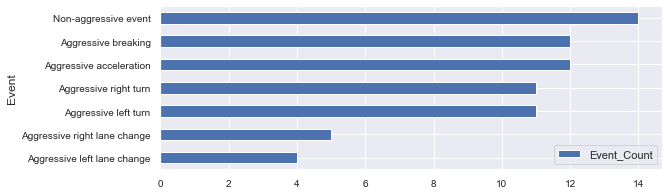

In [43]:
def events_info():
    """
    Provides brief overview of the maneuvers such as when they occur and how many times in all the trips combined
    """
    truth_paths = [path16 + "groundTruth.csv", path17 + "groundTruth.csv", 
                   path21 + "groundTruth.csv", path20 + "groundTruth.csv"]
    
    df_list = [pd.read_csv(path) for path in truth_paths]
    truth = pd.concat(df_list)
    
    # Translating event labels from Portoguese to English
    truth['evento'] = [portu_to_english[x] for x in truth['evento']]
    
    # Renaming columns of Truth df
    truth.columns = ["Event", "Start", "End"]
    
    # Visualization
    groups = truth.groupby('Event')[["Event"]].count().add_suffix("_Count").reset_index().sort_values('Event_Count',ascending=True)
    groups.plot.barh('Event','Event_Count',figsize=(9,3),fontsize = 10)
    return truth


events_info()

# Main Preprocessing Function

In [10]:
path = "./Datasets/Jain Jr Dataset/"

path16 = "./Datasets/Jain Jr Dataset/16/"

path17 = "./Datasets/Jain Jr Dataset/17/"

path20 = "./Datasets/Jain Jr Dataset/20/"

path21 = "./Datasets/Jain Jr Dataset/21/"

In [44]:
def process_path(source_path, dest_path = path, nf =3, axis_list = ["x"], export = False):
    """
    Generates dataframes for each trip that contain classified attribute vectors for each sensor
    Input:
    ======
    source_path: path to folder containing dataset
    dest_path: path to folder where processed dataset will be stored
    nf: Number of frames that make up the time window
    axis_list: list of axis that will be used for classification e.g. ['x'] or ['x','y','z']
    export: Flag that if True, exports dataframes to processed.xslx
    
    Output
    ======
    list of Dataframes corresponding to each Sensor
    
    Sample Usages:
    ==============
    process_path(path16,export=True)
    process_path(path16, nf=4, axis_list = ['x','y','z', export=True)
    
    """
    
    # lin_accel and accel differ only in z values
    linaccel = pd.read_csv(source_path +"aceleracaoLinear_terra.csv")
    
    # Sensor data sampled at 51Hz
    accel = pd.read_csv(source_path + "acelerometro_terra.csv")
    gyro = pd.read_csv(source_path + "giroscopio_terra.csv")
    # Sensor data sampled at 102Hz
    magnet = pd.read_csv(source_path + "campoMagnetico_terra.csv")

    
    # True event labels with start and finish time (seconds).
    truth = pd.read_csv(source_path + "groundTruth.csv")
    
    # Translating event labels from Portoguese to English
    portu_to_english = {'evento_nao_agressivo':'Non-aggressive event','troca_faixa_esquerda_agressiva': 
                        'Aggressive left lane change','aceleracao_agressiva':'Aggressive acceleration',
                        'freada_agressiva':'Aggressive breaking','curva_esquerda_agressiva':'Aggressive left turn',
                        'curva_direita_agressiva':'Aggressive right turn','troca_faixa_direita_agressiva':
                        'Aggressive right lane change'}

    truth['evento'] = [portu_to_english[x] for x in truth['evento']]
    truth.columns = ["Event", "Start", "End"]
    
    print("Trip lasted for", get_trip_duration(convert_to_timeseries(magnet)))
    
    # Creating Dataframes consisting of attribute vectors and labels to train our model
    accel_processed = process_sensor(accel, truth, nf, axis_list)
    df_accel = create_dataframe(accel_processed, nf, axis_list)    
    gyro_processed = process_sensor(gyro, truth, nf, axis_list)
    df_gyro = create_dataframe(gyro_processed, nf, axis_list)  
    magnet_processed = process_sensor(magnet, truth, nf, axis_list)
    df_magnet = create_dataframe(magnet_processed, nf, axis_list)  
    linaccel_processed = process_sensor(linaccel, truth, nf, axis_list)
    df_linaccel = create_dataframe(linaccel_processed, nf, axis_list)  
 
    # Exports dataframes to processed.xslx file
    if export:
        with pd.ExcelWriter(dest_path) as writer:
            df_accel.to_excel(writer, sheet_name = 'Acclerometer')
            df_linaccel.to_excel(writer, sheet_name = 'Linear_Acceleration')
            df_gyro.to_excel(writer, sheet_name = 'Gyroscope')
            df_magnet.to_excel(writer, sheet_name = 'Magnetometer')
            truth.to_excel(writer, sheet_name = 'Events')
            
    return [df_accel,df_magnet,df_gyro,df_linaccel]

# Run to generate CSVs of processed data

# process_path(path16, dest_path = path +"processed16.xlsx", export=True)
# process_path(path17, dest_path = path +"processed17.xlsx", export=True)
# process_path(path20, dest_path = path +"processed20.xlsx", export=True)
# process_path(path21, dest_path = path +"processed21.xlsx", export=True)

# Visualizations:

In [11]:
portu_to_english = {'evento_nao_agressivo':'Non-aggressive event','troca_faixa_esquerda_agressiva': 'Aggressive left lane change',
                    'aceleracao_agressiva':'Aggressive acceleration','freada_agressiva':'Aggressive breaking',
                   'curva_esquerda_agressiva':'Aggressive left turn','curva_direita_agressiva':'Aggressive right turn',
                  'troca_faixa_direita_agressiva':'Aggressive right lane change'}


linaccel = pd.read_csv(path16+"aceleracaoLinear_terra.csv")
accel = pd.read_csv(path16 + "acelerometro_terra.csv")
magnet = pd.read_csv(path16 + "campoMagnetico_terra.csv")
gyro = pd.read_csv(path16 + "giroscopio_terra.csv")
truth = pd.read_csv(path16 + "groundTruth.csv")
truth['evento'] = [portu_to_english[x] for x in truth['evento']]
truth.columns = ["Event", "Start", "End"]


linaccel = convert_to_timeseries(linaccel,True)
accel = convert_to_timeseries(accel,True)
magnet= convert_to_timeseries(magnet,True)
gyro = convert_to_timeseries(gyro,True)

start_time = accel.index.min()
truth['Start'] = truth.Start.apply(lambda x: pd.tseries.offsets.DateOffset(seconds= x)+ start_time)
truth["End"] = truth.End.apply(lambda x: pd.tseries.offsets.DateOffset(seconds= x)+ start_time)


c:\users\baig laptop\appdata\local\programs\python\python37\lib\site-packages\pandas\core\arrays\datetimelike.py:1151: PerformanceWarning:

Adding/subtracting array of DateOffsets to DatetimeArray not vectorized



In [9]:
accel.iplot( y='z', mode='lines', xTitle='time', yTitle='x', title='Accelerometer Data over time')

In [10]:
accel.iplot(subplots = True, y='x', mode='lines', xTitle='time', yTitle='x', title='Accelerometer Data over time', vspan={'x0':'2016-05-14 10:54:52.5','x1':'2016-05-14 10:54:56.5','color':'rgba(30,30,30,0.3)','fill':True,'opacity':.4})

c:\users\baig laptop\appdata\local\programs\python\python37\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [11]:
gyro.iplot(y='z', mode='lines', xTitle='time', yTitle='z', title='Accelerometer Data over time')

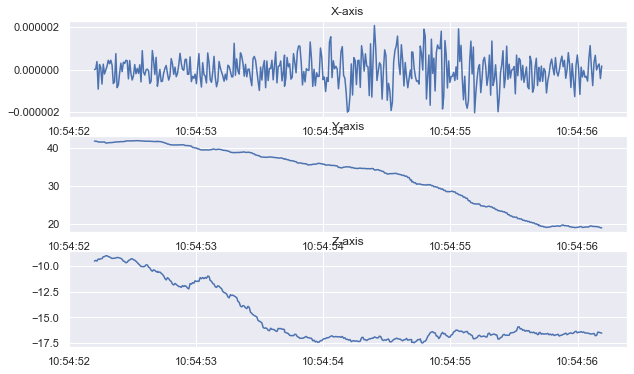

In [35]:
mask = (magnet.index >= truth.iloc[1][1]) & (magnet.index <=truth.iloc[1][2])
sns.set(rc={'figure.figsize':(10, 6)})

fig = plt.figure()
x = magnet[mask]["x"]
y = magnet[mask]["y"]
z = magnet[mask]["z"]
t = magnet.index[mask]
i = 0
for dat, num, axis in zip((x,y,z), range(311, 314), "XYZ"):    
    if i >0:
        plt.subplot(num,sharex = fig.axes[0])
        plt.plot(t, dat)
        plt.title("%s-axis" %axis)
    else: 
        plt.subplot(num)
        plt.plot(t, dat)
        plt.title("%s-axis" %axis)
    i+=1
plt.show()

In [45]:
def pltt(sensor_list, start, end, axes= ["x","y","z"]):
    plt.figure(figsize = (20,4.8))
    offset = pd.tseries.offsets.DateOffset(seconds= 0)
    c = len(axes)
    r = len(sensor_list)
    subplot = 1
    for sensor in sensor_list:   
        mask = (sensor.index >= (start-offset)) & (sensor.index <=(end + offset))
        for axis in axes:
            num = r*100 + c*10 + subplot
            plt.subplot(num)
            plt.plot(sensor.index[mask], sensor[mask][axis])
            plt.title("{} {}-axis".format(num,axis))
            subplot+=1

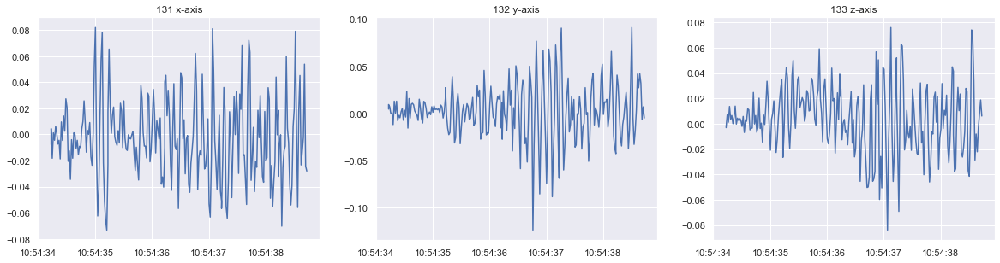

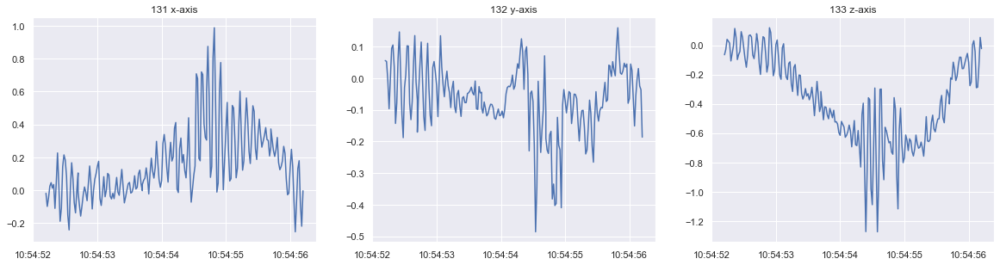

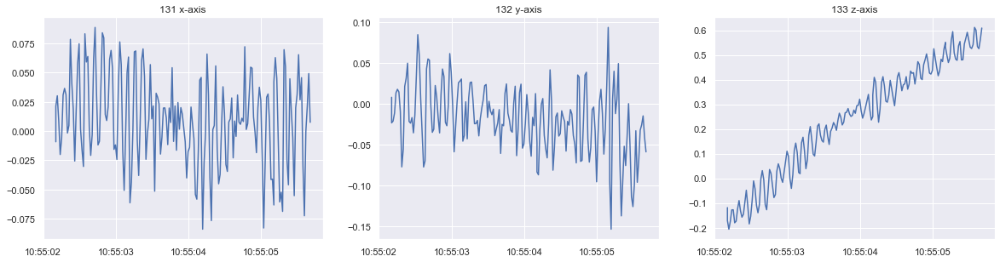

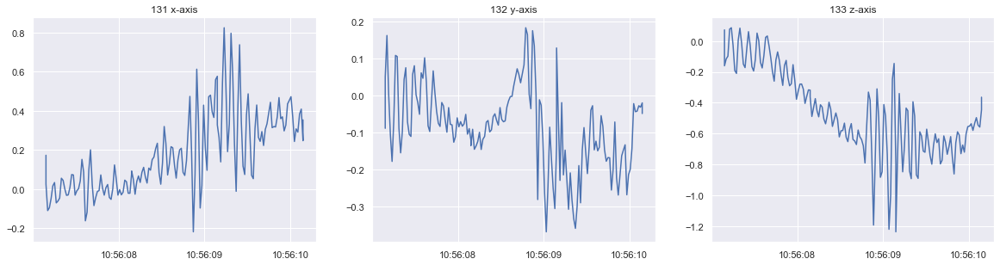

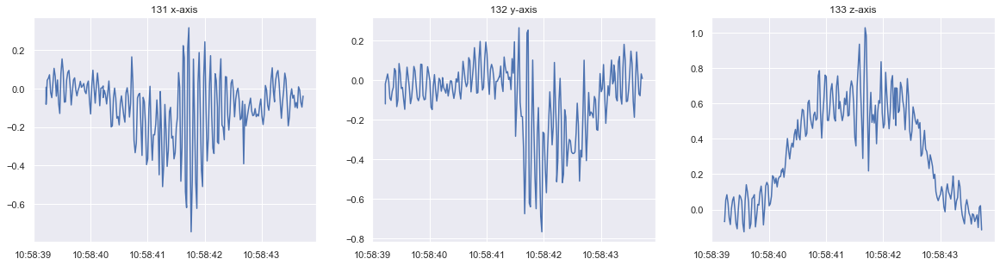

In [46]:
# Sensor plots for Aggressive right turn events

for i in range(truth[truth["Event"] == "Aggressive right turn"].count()[0]):
    pltt([gyro], truth.iloc[i][1], truth.iloc[i][2])


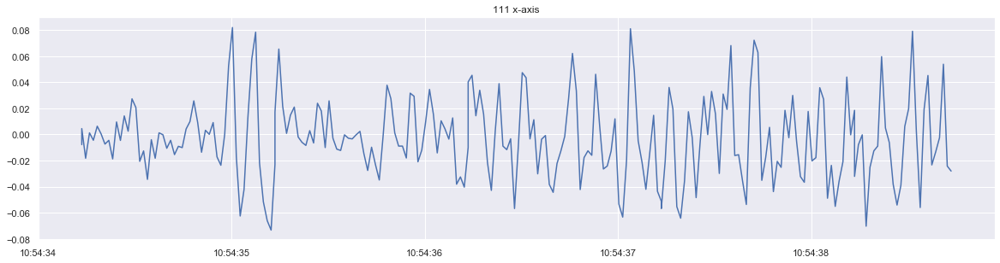

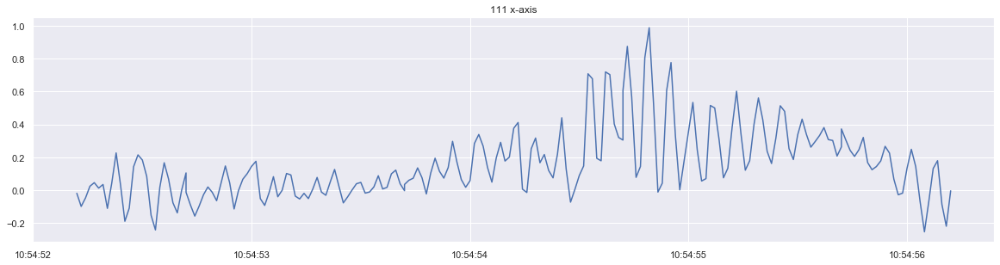

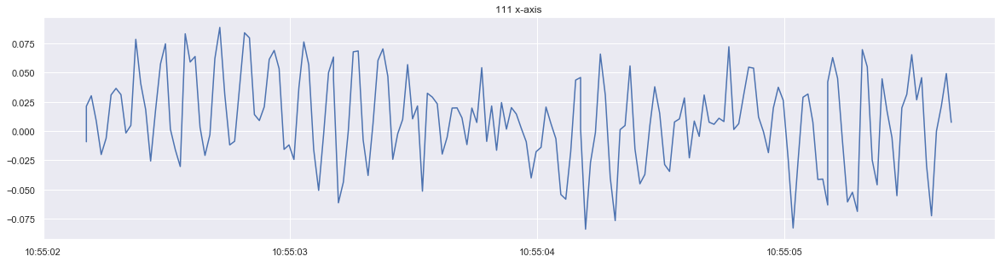

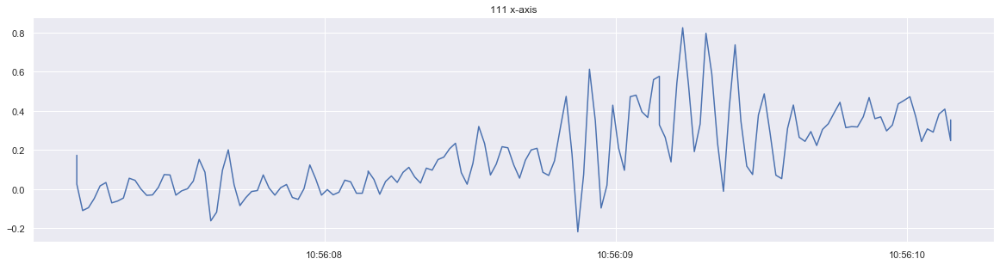

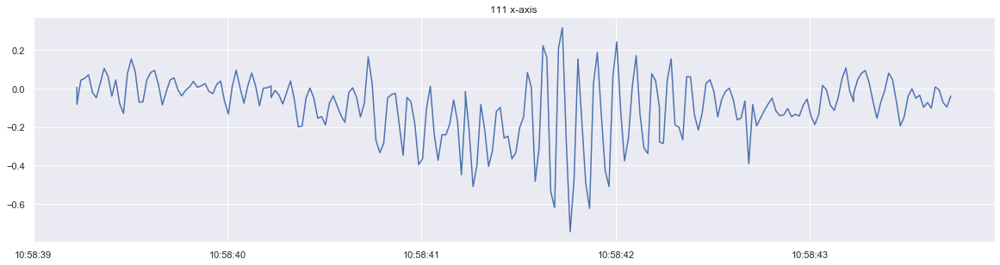

In [42]:
for i in range(truth[truth["Event"] == "Aggressive right turn"].count()[0]):

    pltt([gyro], truth.iloc[i][1], truth.iloc[i][2],['x'])

In [ ]:
ax = plt.gca()

accel.plot(kind='line',y='x',ax=ax)

plt.show()
bx  = plt.gca()
plt.plot(kind='line',x=accel['timestamp'],y=b,ax=bx)
